# Modelo de Markowitz vs Macacos lançando dardos

O objetivo dessa análise é comparar (de forma simples) o retorno de uma carteira de ações baseando-se na fronteira eficiente de Markowitz com uma carteira selecionada aleatoriamente. 

O modelo de Markowitz se baseia na de maximizar o retorno com base em determinado nível de risco assumido, selecionando a distribuição "ótima" de pesos entre os ativos da carteira. Em suma, essa estratégia se dá conforme o gráfico abaixo:

<center>
    <img src="https://www.yourwealth.com/wp-content/uploads/2023/08/Modern-Portfolio-Theory.png" alt="drawing" style="width:70%;align:'center'"/>
      <figcaption>Fonte: <a href="https://www.yourwealth.com/why-modern-portfolio-theory-is-more-viable-than-ever/">Why Modern Portfolio Theory is More Viable Than Ever</a></figcaption>

</center>


Para realizar o experimento, outra ideia também será usada: a de que a seleção aleatória de ações, com pesos iguais, bate o mercado a longo prazo. A estratégia já foi debatida e avaliada em diversos estudos e artigos ([1](https://www.forbes.com/sites/rickferri/2012/12/20/any-monkey-can-beat-the-market/#50d28c60630a), [2](https://thereformedbroker.com/wp-content/uploads/2014/11/jpm_summer2013_rallc.pdf) e [3](https://seekingalpha.com/article/130503-the-investment-circus-why-mean-ignorant-monkeys-beat-median-jumping-clowns), por exemplo) e é bastante divulgada como "macacos jogando dardos" por conta de uma frase do professor Burton Malkiel em seu livro best-seller "A Random Walk Down Wall Street": “Um macaco vendado jogando dardos nas páginas financeiras de um jornal poderia selecionar um portfólio que funcionaria tão bem quanto aquele cuidadosamente selecionado por especialistas”.

Dois motivos geralmente atribuídos para esses resultados são:

* Os retornos de ações serem altamente assimétricos, ou seja, eles não seguem uma distribuição simétrica, como uma curva normal (onde os retornos positivos e negativos estariam distribuídos de forma equilibrada em torno de uma média). Em vez disso, há uma inclinação em direção a um dos lados – ou seja, um lado da distribuição de retornos é mais frequente ou mais extremo do que o outro.

* A alocação uniforme (mesmo peso para todos ativos) tende a gerar mais retornos, fenômeno geralmente atriuído à diversificação "obrigatória" que esse modelo propões, à diluição dos ricos e exposição mais alta a ativos com menor valor e maior potencial de crescimento.

## Dados

Para realizar o experimento, os seguintes dados foram usados

* Ações disponíveis em 2014
  * [Séries Históricas - B3](https://www.b3.com.br/pt_br/market-data-e-indices/servicos-de-dados/market-data/historico/mercado-a-vista/series-historicas/)
* Composição do IBovespa (maio de 2014)
  * [Mercado Bovespa em 02 de Maio de 2014](https://br.advfn.com/indice/ibovespa/2014/05/02)

## Metodologia

A ideia é utilizar dados entre 2014 e 2019 para selecionar uma carteira a ser mantida até 2024. Para isso, será feita uma comparação sobre o retorno final, em 2024, de uma carteira montada com o modelo de Markowitz e a média de retorno e risco das carteiras escolhidas aleatoriamente, conforme o seguinte:

* Markowitz
  * Escolha de 10 ativos com participação no Ibovespa em 2014 com maior crescimento entre janeiro e fevereiro de 2014;
  * Geração de 50 mil carteiras para o período de 2014 a 2019, com pesos gerados aleatoriamente;
  * Escolha da melhor carteira baseada no Sharpe Ratio.
* Macacos
  * Geração de 50 mil carteiras, com ativos escolhidos aleatoriamente e pesos iguais, para o período de 2014 a 2024;

Ao fim, será possível checar quantas carteiras aleatórias bateram a carteira com o modelo de Markowitz, seguindo um critério de escolha mais simples.

Além disso, para simplicar ainda mais a análise, não serão consideradas falências ou fusões e aquisições, ou seja, só ações ON existentes entre 2014 e 2024 que tenham mantido o nome original.

## Bibliotecas

In [74]:
import random
import pandas as pd
import plotly.graph_objects as go
from tqdm import tqdm
from IPython import display
import pickle
import numpy as np
import plotly.express as px
import yfinance as yf
from scipy import optimize
import matplotlib.pyplot as plt
from scipy.stats import norm


In [2]:
def read_txt_file(filename):
    f = open(filename, 'r')
    f_content = f.read().strip()
    f.close()
    return f_content

## Lista de ações disponíveis em 2021

In [3]:
filename = 'cotacoes_2014_b3.txt'

content = read_txt_file(filename)

rows = content.split('\n')
rows[:3]

['012014010202AAPL34      010APPLE       DRN          R$  000000001321200000000132120000000013212000000001321200000000132120000000013190000000001334000001000000000000000900000000000011890800000000000000009999123100000010000000000000BRAAPLBDR004106',
 '012014010202ABCB4       010ABC BRASIL  PN  EJS N2   R$  000000000123100000000012360000000001170000000000119200000000011900000000001175000000000119001544000000000000361200000000000430789400000000000000009999123100000010000000000000BRABCBACNPR4121',
 '012014010296ABCB4F      020ABC BRASIL  PN  EJS N2   R$  000000000121000000000012100000000001176000000000117900000000011760000000001152000000000124900003000000000000000143000000000000168614000000000000009999123100000010000000000000BRABCBACNPR4121']

In [4]:
rows[0][12:17]

'AAPL3'

In [5]:
# Coletando ações ON
tickers = list(set([t[12:17] for t in rows if t[16] == '3' and t[12:16].isalpha() and t[17] == " "]))
tickers[:10]

['HYPE3',
 'SSBR3',
 'CTAX3',
 'CIEL3',
 'TGMA3',
 'ECOR3',
 'ENBR3',
 'QUAL3',
 'BRPR3',
 'ENEV3']

In [6]:
# Coletando dados das ações disponíveis na API do Yahoo que contenham dados de 2014 a 2024

# available_tickers = {}
# for ticker in tqdm(tickers):
#     data = yf.Ticker(f"{ticker}.SA").history(period="max").reset_index()
#     if len(data) and data['Date'].dt.year.eq(2014).any() and data['Date'].dt.year.eq(2024).any():
#         available_tickers[ticker] = data
#     display.clear_output(wait=True)

In [7]:
# f = open('available_tickers.pkl', 'wb')
# pickle.dump(available_tickers, f)
# f.close()

In [8]:
available_tickers = pickle.load(open('available_tickers.pkl', 'rb'))

In [9]:
print("Número de ações disponíveis:", len(available_tickers))

Número de ações disponíveis: 127


In [10]:
# Coletando dados do IBovespa

ibovespa = yf.Ticker("^BVSP").history(period="max")
ibovespa = ibovespa.reset_index()
ibovespa = ibovespa[ibovespa['Date'] >= '2014-01-01'].reset_index(drop=True)
ibovespa_until_2019 = ibovespa[ibovespa['Date'] <= '2019-12-31'].reset_index(drop=True)

## Simulando carteira - Markowitz

In [11]:
filename = 'ibovespa_2014.txt'

content = read_txt_file(filename)

ibovespa_2014 = content.split('\n')
ibovespa_2014[:10]

['ALLL3',
 'ABEV3',
 'AEDU3',
 'BVMF3',
 'BBAS3',
 'BBSE3',
 'BRML3',
 'BRPR3',
 'BBDC4',
 'BBDC3']

In [12]:
# Coletando ações ON
ibovespa_2014 = [t for t in ibovespa_2014 if t[-1] == '3']
ibovespa_2014[:10]

['ALLL3',
 'ABEV3',
 'AEDU3',
 'BVMF3',
 'BBAS3',
 'BBSE3',
 'BRML3',
 'BRPR3',
 'BBDC3',
 'BRFS3']

In [13]:
jan_2014_growths = {}

for ticker in ibovespa_2014:
    if ticker in available_tickers:
        jan_start = available_tickers[ticker][available_tickers[ticker]['Date'] == '2014-01-02']['Close'].values[0]
        jan_end = available_tickers[ticker][available_tickers[ticker]['Date'] == '2014-02-28']['Close'].values[0]
        jan_2014_growths[ticker] = float(jan_end/jan_start)

In [14]:
jan_2014_growths = dict(sorted(jan_2014_growths.items(), key=lambda x:x[1], reverse=True))
print('Lista de ações com maior valorização entre jan/2014 e fev/2014:')
for ticker, growth in list(jan_2014_growths.items())[:10]:
    print(f'{ticker}: {growth:.2f}')

Lista de ações com maior valorização entre jan/2014 e fev/2014:
EMBR3: 1.09
MRFG3: 1.06
DASA3: 1.05
MRVE3: 1.03
GFSA3: 1.01
BBSE3: 1.00
LREN3: 0.98
ABEV3: 0.98
UGPA3: 0.97
RENT3: 0.95


In [15]:
markowitz_portifolio_tickers = [ticker for ticker, _ in list(jan_2014_growths.items())[:10]]
markowitz_portifolio_tickers

['EMBR3',
 'MRFG3',
 'DASA3',
 'MRVE3',
 'GFSA3',
 'BBSE3',
 'LREN3',
 'ABEV3',
 'UGPA3',
 'RENT3']

In [16]:
markowitz_portifolio = {}
for ticker in markowitz_portifolio_tickers:
    markowitz_portifolio[ticker] =  available_tickers[ticker][
                        (available_tickers[ticker]['Date'] >= '2014-01-01') & 
                        (available_tickers[ticker]['Date'] <= '2019-12-31')
    ].reset_index(drop=True)

In [17]:
fig = go.Figure([
    go.Scatter(x=markowitz_portifolio[ticker]['Date'], 
               y=markowitz_portifolio[ticker]['Open'],
              name=ticker)
                for ticker in markowitz_portifolio_tickers] + 
                    [go.Scatter(x=ibovespa_until_2019['Date'], 
               y=ibovespa_until_2019['Open'],
              name="Ibovespa")
                ])
fig.update_layout(
    title="Variação do preço das ações no portifólio",
    xaxis_title="Anos",
    yaxis_title="Preço",
    template="plotly_white"
)
fig.show()

### Retorno diário

Para calcular o retorno diários das ações, será usado o retorno logarítmico, dado por:

$ \Large{r} = \Large\log(\Large\frac{p_n}{p_{n-1}})$

onde $p_n$ é o preço do dia $n$ e $p_{n-1}$ o preço no dia $n-1$.

O uso dessa estratégia em relação ao retorno tradicional ($\Large{r} = \Large\frac{p_n}{p_{n-1}}$) garante algumas propriedades interessantes para análises, tais como:

* Aditividade, o que significa que é possível somar os retornos logarítmicos diários para obter o retorno logarítmico total de um período mais longo. Para o retorno tradicional, seria necessário multiplicar fatores de retorno, o que é menos conveniente.
Por exemplo, se $r_1$ e $r_2$ são retornos logarítmicos de dois dias consecutivos, o retorno total para os dois dias é simplesmente $𝑟_1 + r_2$, enquanto para retornos simples é $(1 + 𝑟_1) * (1 + r_2) - 1$;

* Simetria. No caso de retornos logarítmicos, uma queda e um aumento de mesmo percentual têm impactos iguais em valor absoluto, ou seja, efeitos de aumento e queda percentuais são consistentes em ambos os sentidos. Com retornos simples, uma queda de 50% seguida de uma alta de 50% não leva ao ponto de partida original.

In [18]:
for ticker in markowitz_portifolio:
    markowitz_portifolio[ticker]['Return'] = np.log(markowitz_portifolio[ticker]['Open'] / markowitz_portifolio[ticker]['Open'].shift(1))

ibovespa['Return'] = np.log(ibovespa['Open'] / ibovespa['Open'].shift(1))
ibovespa_until_2019 = ibovespa[ibovespa['Date'] <= '2019-12-31'].reset_index(drop=True)

In [19]:
fig = px.line(title = 'Histórico de retorno diário das ações')
for ticker in markowitz_portifolio:
  fig.add_scatter(x = markowitz_portifolio[ticker]["Date"] ,y = markowitz_portifolio[ticker]['Return'], name = ticker)

fig.add_scatter(x = ibovespa_until_2019["Date"] ,y = ibovespa_until_2019['Return'], name = 'Ibovespa')

fig.show()

In [20]:
returns = pd.DataFrame()
for ticker in markowitz_portifolio_tickers:
    returns[ticker] = markowitz_portifolio[ticker]['Return']
returns['IBOVESPA'] = ibovespa['Return']
returns

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3,IBOVESPA
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.005746,-5.064382e-02,-0.013831,-0.069668,-0.088163,-0.018167,-0.036930,0.006338,-0.026649,-0.021168,-0.023050
2,0.001561,5.802389e-02,0.027474,0.066119,0.071141,-0.018928,0.006924,-0.026777,-0.017859,0.018772,0.012475
3,0.003115,-2.453874e-03,0.002031,-0.013119,0.058350,-0.019726,0.001346,0.005296,-0.003350,-0.011160,0.000039
4,0.002589,3.144129e-02,-0.015673,-0.024303,-0.041328,-0.003906,0.005197,0.018029,0.002421,-0.016823,-0.010867
...,...,...,...,...,...,...,...,...,...,...,...
1486,-0.004652,-4.000538e-02,-0.034068,0.013831,-0.035694,0.021109,0.010670,0.000997,0.027079,0.018546,-0.007119
1487,0.017972,-2.166150e-02,0.000000,-0.037318,0.009377,-0.014200,0.001079,0.020729,0.011443,-0.015286,-0.001756
1488,0.004063,-4.179645e-03,0.000000,-0.000951,0.079427,0.004756,0.005861,-0.002634,0.028836,0.019188,-0.003598
1489,-0.000507,2.787990e-02,0.000000,0.047838,0.080422,0.001317,0.019487,0.015180,0.017222,0.029872,-0.002584


In [21]:
returns.describe()

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3,IBOVESPA
count,1.490000e+03,1490.000000,1490.000000,1490.000000,1490.000000,1490.000000,1490.000000,1.490000e+03,1490.000000,1490.000000,1490.000000
mean,5.732175e-05,0.000594,0.000971,0.000957,-0.000678,0.000551,0.001223,2.372574e-04,0.000039,0.001110,0.000542
std,2.152341e-02,0.029011,0.024720,0.023145,0.033118,0.019954,0.021430,1.467985e-02,0.018761,0.023033,0.014190
min,-1.472207e-01,-0.175353,-0.136280,-0.165815,-0.301648,-0.168740,-0.187517,-1.207816e-01,-0.079867,-0.175622,-0.092048
25%,-1.211826e-02,-0.015699,-0.004246,-0.012399,-0.019657,-0.010690,-0.011700,-8.126255e-03,-0.010611,-0.012673,-0.007730
50%,-4.643918e-08,-0.000898,0.000000,0.000633,-0.000280,0.000598,0.000629,1.507075e-07,0.000147,0.000233,0.000476
75%,1.258519e-02,0.016025,0.003720,0.015051,0.016184,0.011781,0.013795,8.980729e-03,0.010485,0.014520,0.008880
max,1.929781e-01,0.187397,0.248697,0.101664,0.221320,0.133485,0.108540,6.521183e-02,0.082861,0.098488,0.063760


In [22]:
returns.mean()*100

EMBR3       0.005732
MRFG3       0.059443
DASA3       0.097052
MRVE3       0.095707
GFSA3      -0.067810
BBSE3       0.055140
LREN3       0.122264
ABEV3       0.023726
UGPA3       0.003941
RENT3       0.110991
IBOVESPA    0.054180
dtype: float64

In [23]:
returns.std()*100

EMBR3       2.152341
MRFG3       2.901102
DASA3       2.471960
MRVE3       2.314490
GFSA3       3.311838
BBSE3       1.995441
LREN3       2.143000
ABEV3       1.467985
UGPA3       1.876140
RENT3       2.303267
IBOVESPA    1.418988
dtype: float64

In [24]:
returns.corr()

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3,IBOVESPA
EMBR3,1.000000,0.127047,-0.015081,0.167553,0.120547,0.160833,0.175058,0.235213,0.189568,0.171322,0.048359
MRFG3,0.127047,1.000000,0.062380,0.323132,0.253249,0.346403,0.290278,0.280275,0.296639,0.296129,0.186902
DASA3,-0.015081,0.062380,1.000000,0.045565,0.060986,0.019819,0.003855,0.014246,0.037737,0.013923,0.033265
MRVE3,0.167553,0.323132,0.045565,1.000000,0.340384,0.410745,0.418373,0.346911,0.385609,0.409621,0.240933
GFSA3,0.120547,0.253249,0.060986,0.340384,1.000000,0.276662,0.277910,0.240620,0.223463,0.284021,0.218930
BBSE3,0.160833,0.346403,0.019819,0.410745,0.276662,1.000000,0.485021,0.415721,0.423465,0.465517,0.280813
LREN3,0.175058,0.290278,0.003855,0.418373,0.277910,0.485021,1.000000,0.413041,0.430498,0.499490,0.236527
ABEV3,0.235213,0.280275,0.014246,0.346911,0.240620,0.415721,0.413041,1.000000,0.425773,0.379449,0.200587
UGPA3,0.189568,0.296639,0.037737,0.385609,0.223463,0.423465,0.430498,0.425773,1.000000,0.398379,0.206542
RENT3,0.171322,0.296129,0.013923,0.409621,0.284021,0.465517,0.499490,0.379449,0.398379,1.000000,0.242245


In [25]:
fig = go.Figure(
    data=go.Heatmap(
        z=returns.corr().values,
        x=returns.corr().columns,
        y=returns.corr().columns,
        colorscale='Viridis',
        colorbar=dict(title="Correlação"),
        text=returns.corr().round(2).values,
        texttemplate="%{text}", 
        textfont=dict(color="white")   
    )
)

fig.update_layout(
    title="Matriz de correlação das ações",
    xaxis=dict(title="Ações"),
    yaxis=dict(title="Ações"),
    autosize=False,
    width=600,
    height=600,
)

fig.show()

In [26]:
corr_list = returns.corr().unstack().reset_index()
corr_list.columns = ['Ação1','Ação2','Corr']

# Removendo "auto-correlações"
corr_list = corr_list[corr_list['Ação1'] != corr_list['Ação2']]

corr_list.sort_values('Corr', ascending=False).head(20).iloc[1::2]

,Ação1,Ação2,Corr
75,LREN3,RENT3,0.499490
71,LREN3,BBSE3,0.485021
104,RENT3,BBSE3,0.465517
74,LREN3,UGPA3,0.430498
95,UGPA3,ABEV3,0.425773
63,BBSE3,UGPA3,0.423465
69,LREN3,MRVE3,0.418373
62,BBSE3,ABEV3,0.415721
73,LREN3,ABEV3,0.413041
38,MRVE3,BBSE3,0.410745


## Carteira simulada - Monte Carlo + Markowitz

### Modelo de Markowitz

O modelo de Markowitz é composto montando um portfólio de investimentos composto por múltiplos ativos, onde o retorno e o risco (volatilidade) são calculados de acordo com as proporções e correlações dos ativos.

Dessa forma, o retorno esperado é dado por:

$\Large{{E} (R_{p})=\sum _{i}w_{i}\operatorname {E} (R_{i})\quad}$

e a variância:

$ \Large{\sigma _{p}^{2}=\sum _{i}w_{i}^{2}\sigma _{i}^{2}+\sum _{i}\sum _{j\neq i}w_{i}w_{j}\sigma _{i}\sigma _{j}\rho _{ij}}$


* $\sigma_{i} $ é o desvio padrão do ativo $i$ (uma medida de sua volatilidade),
* $\rho_{ij}$ é a correlação entre os retornos dos ativos $𝑖$ e $𝑗$.

Essa formulação pode ser reescrita como:

$\Large{\sigma _{p}^{2}=\sum _{i}\sum _{j}w_{i}w_{j}\sigma _{ij}}$

onde:


* $\sigma_{ij} = \sigma_{i}\sigma_{j}\rho_{ij} $ é a covariância dos retornos dos ativo $i$ e $j$.


Além disso, é possível simplificar a notação organizando os retornos de N ativos em um vetor de dimensão $𝑁 × 1$ chamado $𝑅$, onde o primeiro elemento é o retorno do primeiro ativo, o segundo elemento é o retorno do segundo ativo, e assim por diante.

Organizando os retornos esperados desses ativos em um vetor coluna $\mu$ e suas variâncias e covariâncias em uma matriz de covariância $\Sigma$ e considerando um portfólio de ativos de risco cujos pesos para cada um dos $N$ ativos de risco são dados pelos elementos correspondentes no vetor de pesos $w$, tem-se:

* Retorno esperado do portfólio: $\Large{ w'\mu }$
* Variância do portfólio: $\Large{ w'\Sigma w}$

## Simulação de Monte Carlo para uma carteira com modelo de Markowitz 

Nesse contexto, é possível utilizar uma simulação Monte Carlo para encontrar valores aleatórios dos pesos. Com essa formulação, os melhores pesos serão selecionados a partir do **Sharpe ratio**, que permite avaliar a relação entre o retorno e o risco de um portfólio de investimentos.

Ele indica quanto retorno adicional (acima da taxa livre de risco) um investidor recebe por unidade de risco assumido. Em resumo, quanto maior o Índice de Sharpe, melhor o retorno ajustado pelo risco do portfólio. Sua fórmula é:

$\Large{S = \frac{E(R_p) - R_f}{\sigma_p}}$

onde:

* $E(R_p)$ é o retorno esperado do portfólio,
* $R_f$é a taxa de retorno livre de risco (como a taxa de um título do governo),
* $\sigma_p$ é a volatilidade (ou desvio padrão) dos retornos do portfólio, que representa o risco do portfólio.


In [27]:
portfolio = pd.DataFrame()
for ticker in markowitz_portifolio_tickers:
    portfolio[ticker] = markowitz_portifolio[ticker]['Close']

In [28]:
portfolio

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3
0,18.209976,2.531138,13.404299,4.433001,174.832977,10.809416,6.960318,11.417546,9.425428,8.177188
1,18.134100,2.603456,13.861689,4.793960,190.946594,10.574721,7.058234,11.174619,9.370058,8.339483
2,18.115133,2.675775,13.796346,4.703718,197.392044,10.425780,6.959138,11.030176,9.224706,8.167205
3,18.304813,2.728369,13.581655,4.568361,190.140915,10.358084,7.097166,11.378152,9.262771,8.112269
4,18.399660,2.715220,13.441636,4.557080,189.335236,10.488967,7.084190,11.489769,9.404667,8.139734
...,...,...,...,...,...,...,...,...,...,...
1486,19.650000,6.239090,56.734615,18.977110,59.329472,24.972164,44.287331,15.930836,9.889529,41.415386
1487,19.730000,6.179921,56.734615,19.004288,63.595509,25.111115,44.597363,15.972958,10.178862,42.558605
1488,19.719999,6.370579,56.734615,19.502491,66.597534,24.985390,45.271854,16.191994,10.287361,43.886284
1489,19.719999,6.416600,56.734615,19.873882,67.782539,25.038332,44.658882,16.141449,10.335582,43.613468


In [29]:
len(portfolio)

1491

In [30]:
num_simulations = 50000

portfolio_returns = np.log(portfolio/portfolio.shift(1))
simulated_weights = np.zeros((num_simulations, 10))
simulated_returns = np.zeros(num_simulations)
simulated_vol = np.zeros(num_simulations)
simulated_sharpe_ratio = np.zeros(num_simulations)

In [31]:
np.random.seed(42)
for i in tqdm(range(num_simulations)):
    # Weights
    weights = np.array(np.random.random(10))
    weights = weights/np.sum(weights)
    
    # Save weights
    simulated_weights[i,:] = weights
    
    # Expected return
    simulated_returns[i] = np.sum((portfolio_returns.mean() * weights))
    
    # Expected volatility
    simulated_vol[i] = np.sqrt(np.dot(weights.T, np.dot(portfolio_returns.cov(), weights)))
    
    # Sharpe Ratio
    simulated_sharpe_ratio[i] = simulated_returns[i]/simulated_vol[i]

100%|██████████████████████████| 50000/50000 [08:16<00:00, 100.68it/s]


In [32]:
simulation = {'seed': 42, 'num_rounds': 50000, 
              'returns': simulated_returns, 'vol': simulated_vol, 'sharpe_ratio': simulated_sharpe_ratio,
             'weights': simulated_weights}
f = open('portfolio_simulation.pkl', 'wb')
pickle.dump(simulation, f)
f.close()

In [33]:
simulation = pickle.load(open('portfolio_simulation.pkl', 'rb'))

In [34]:
simulated_returns = simulation['returns']
simulated_vol = simulation['vol']
simulated_sharpe_ratio = simulation['sharpe_ratio']
simulated_weights = simulation['weights']

In [35]:
print("Maior Sharpe Ratio: {}". format(simulated_sharpe_ratio.max()))
print("Posição do maior Sharpe Ratio: {}". format(simulated_sharpe_ratio.argmax()))

Maior Sharpe Ratio: 0.07218687093394922
Posição do maior Sharpe Ratio: 37823


In [36]:
best_weights = simulated_weights[simulated_sharpe_ratio.argmax(),:]
print("Melhores pesos para carteira:", best_weights)

Melhores pesos para carteira: [0.07411131 0.00671519 0.23927202 0.02543305 0.00759211 0.01852235
 0.30892523 0.09297833 0.0119731  0.21447732]


In [37]:
best_return = simulated_returns[simulated_sharpe_ratio.argmax()]
best_vol = simulated_vol[simulated_sharpe_ratio.argmax()]
print("Melhor retorno (baseado no Sharpe Ratio):", best_return*100)
print("Melhor vol:", best_vol*100)

Melhor retorno (baseado no Sharpe Ratio): 0.09157722430092746
Melhor vol: 1.2686132965192571


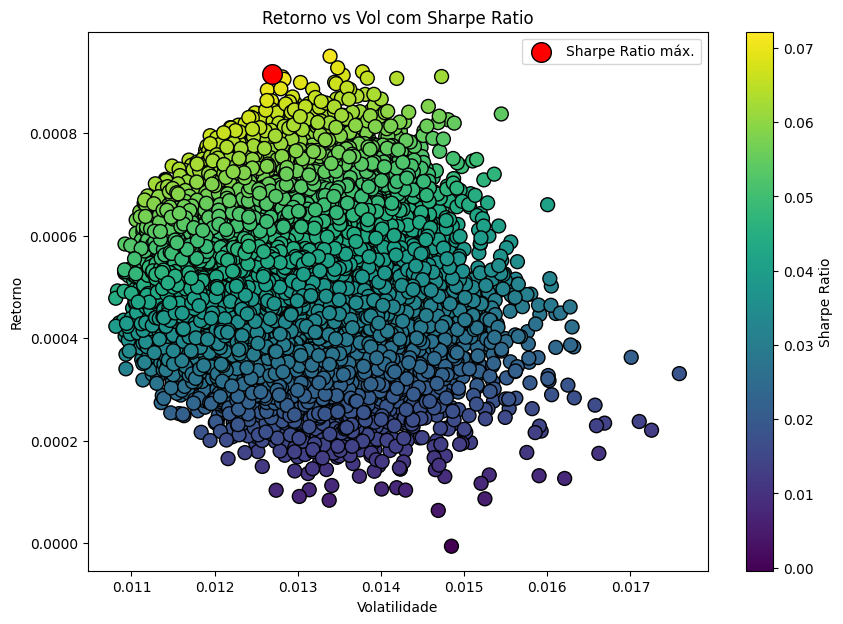

In [38]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    simulated_vol, 
    simulated_returns, 
    c=simulated_sharpe_ratio, 
    cmap='viridis', 
    s=100,
    edgecolor='k'
)
plt.colorbar(scatter, label='Sharpe Ratio')

plt.scatter(
    best_vol, 
    best_return, 
    color='red', 
    s=200, 
    edgecolor='k', 
    label="Sharpe Ratio máx."
)

# Add labels and title
plt.title('Retorno vs Vol com Sharpe Ratio')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno')
plt.legend(loc="upper right")

# Show plot
plt.show()

## Otimizando fronteira eficiente

Para determinar a fronteira eficiente, ou seja, definir quais portifólios entregam o melhor retorno para cada nível de risco (i.e., volatidade ou variância) é possível utilizar um método de otimização para funções não lineares.

Para isso, será utilizado um método de mínimos quadrados sequenciais (*Sequential Least Squares Quadratic Programming*, em inglês) que irá otimizar a função que representa a fonteira, tomando com base duas restrições:

* A soma dos pesos dos ativos deve ser igual a 1;
* Cada peso deve estar entre 0 e 1.

In [39]:
# Baseado no código de exemplo do professor João Gabriel de Moraes Souza

def get_portfolio_data(weights):
    portfolio_data = {}
    weights = np.array(weights)
    portfolio_data['return'] = np.sum(portfolio_returns.mean() * weights)
    portfolio_data['vol'] = np.sqrt(np.dot(weights.T, np.dot(portfolio_returns.cov(), weights)))
    portfolio_data['sharpe_ratio'] = portfolio_data['return']/portfolio_data['vol']
    return portfolio_data

# Função para negar Sharpe Ratio
# Como scipy.optimize minimiza funções e no Sharpe Ratio quanto maior o valor, melhor,
# é necessário inverter seu sinal para prepará-lo para minização
def get_negative_sharpe_ratio(weights):
    return get_portfolio_data(weights)['sharpe_ratio'] * -1

def check_if_sum_is_1(weights):
    return np.sum(weights)-1

In [40]:
constraints = ({'type': 'eq', 'fun': check_if_sum_is_1}) # Definição das restrições
bounds = ((0,1),)*10
initial_guess = ((0.1),)*10
opt_results = optimize.minimize(get_negative_sharpe_ratio, initial_guess, method="SLSQP", bounds= bounds, constraints=constraints)
print(opt_results)

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -0.07814897346555665
       x: [ 1.145e-17  1.041e-03  2.552e-01  9.784e-02  2.064e-17
            0.000e+00  4.592e-01  0.000e+00  1.865e-17  1.867e-01]
     nit: 13
     jac: [ 1.132e-02  2.974e-05  4.944e-04 -3.538e-04  9.854e-02
            1.159e-02 -1.942e-04  1.368e-02  4.239e-02 -1.964e-05]
    nfev: 144
    njev: 13


In [41]:
frontier_y = np.linspace(0.000, 0.001, 100) # Retorna 100 pontos espaçados igualmente entre 0 e 0.0004

In [42]:
def minimize_volatility(weights):
    return get_portfolio_data(weights)['vol']
    
frontier_x = []

for possible_return in tqdm(frontier_y):
    constraints = ({'type':'eq', 'fun': check_if_sum_is_1},
            {'type':'eq', 'fun': lambda w: get_portfolio_data(w)['return'] - possible_return})
    
    result = optimize.minimize(minimize_volatility,initial_guess,method='SLSQP', bounds=bounds, constraints=constraints)
    frontier_x.append(result['fun'])

100%|███████████████████████████████| 100/100 [03:52<00:00,  2.32s/it]


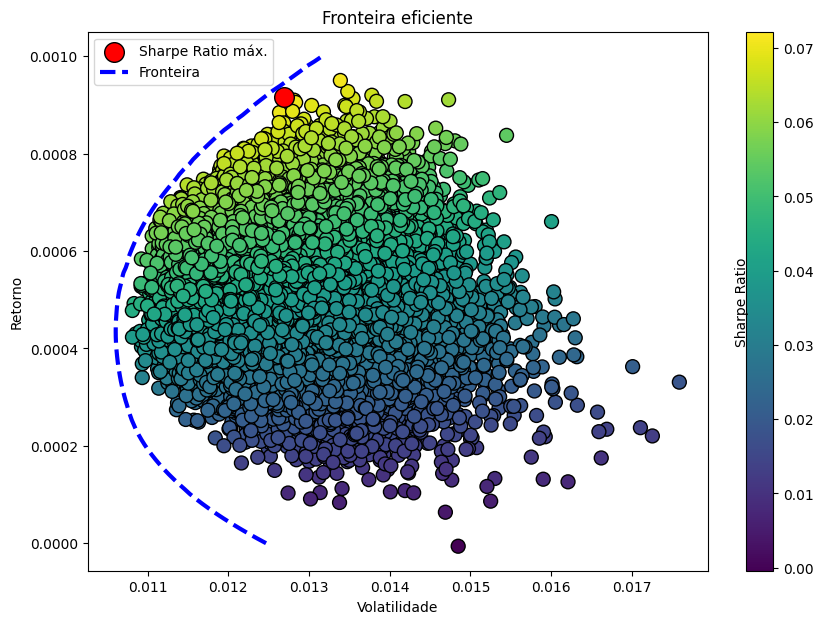

In [43]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    simulated_vol, 
    simulated_returns, 
    c=simulated_sharpe_ratio, 
    cmap='viridis', 
    s=100,
    edgecolor='k'
)
colorbar = plt.colorbar(scatter, label='Sharpe Ratio')
colorbar.ax.yaxis.set_label_coords(-0.4, 0.5)

plt.scatter(
    best_vol, 
    best_return, 
    color='red', 
    s=200, 
    edgecolor='k', 
    label="Sharpe Ratio máx."
)

plt.plot(frontier_x, frontier_y, 'b--', linewidth=3, label="Fronteira")

plt.title('Fronteira eficiente')
plt.xlabel('Volatilidade')
plt.ylabel('Retorno')
plt.legend(loc="upper left")

plt.show()


In [44]:
def asset_allocation(stocks_df, total_money, optimal_weights):
    stocks_df = stocks_df.copy()

    stock_columns = stocks_df.columns
    stocks_df[stock_columns] = stocks_df[stock_columns].div(stocks_df[stock_columns].iloc[0])

    for i, stock in enumerate(stock_columns):
        stocks_df[stock] = stocks_df[stock] * weights[i] * total_money

    stocks_df['total_value'] = stocks_df[stock_columns].sum(axis=1)

    stocks_df['daily_return'] = np.log(stocks_df['total_value'] / stocks_df['total_value'].shift(1)) * 100

    asset_weights = pd.DataFrame({'stocks': stock_columns, 'weights': weights})

    final_value = stocks_df['total_value'].iloc[-1]
    return stocks_df, asset_weights, final_value

In [45]:
portfolio_until_2024 = pd.DataFrame()

for ticker in markowitz_portifolio_tickers:
    portfolio_until_2024[ticker] = available_tickers[ticker][(available_tickers[ticker]['Date'] >= '2014-01-01') & 
                                    (available_tickers[ticker]['Date'] <= '2024-12-31')].reset_index(drop=True)['Close']
portfolio_until_2024_dates = available_tickers[ticker][(available_tickers[ticker]['Date'] >= '2014-01-01') & 
                                    (available_tickers[ticker]['Date'] <= '2024-12-31')].reset_index(drop=True)['Date']
portfolio_until_2024

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3
0,18.209976,2.531138,13.404299,4.433001,174.832977,10.809416,6.960318,11.417546,9.425428,8.177188
1,18.134100,2.603456,13.861689,4.793960,190.946594,10.574721,7.058234,11.174619,9.370058,8.339483
2,18.115133,2.675775,13.796346,4.703718,197.392044,10.425780,6.959138,11.030176,9.224706,8.167205
3,18.304813,2.728369,13.581655,4.568361,190.140915,10.358084,7.097166,11.378152,9.262771,8.112269
4,18.399660,2.715220,13.441636,4.557080,189.335236,10.488967,7.084190,11.489769,9.404667,8.139734
...,...,...,...,...,...,...,...,...,...,...
2702,53.790001,15.100000,2.480000,6.930000,1.490000,34.290001,16.969999,12.330000,20.530001,40.900002
2703,55.650002,15.400000,2.420000,7.100000,1.580000,34.200001,16.740000,12.510000,20.500000,42.570000
2704,54.130001,15.710000,2.340000,6.970000,1.480000,33.740002,16.719999,12.580000,20.430000,45.459999
2705,56.689999,15.610000,2.270000,6.930000,1.470000,33.540001,16.580000,12.730000,20.570000,45.180000


In [46]:
stocks_values, stocks_weights, total_sum = asset_allocation(portfolio_until_2024, 35000, best_weights)

In [47]:
stocks_values

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3,total_value,daily_return
0,1084.106581,4166.976673,3576.127209,3877.782227,4886.783276,3373.418305,5015.326711,2472.283297,3370.715236,3176.480487,35000.000000,NaN
1,1079.589391,4286.032510,3698.154048,4193.531927,5337.177446,3300.174508,5085.881154,2419.681300,3350.913736,3239.525141,35990.661162,2.791143
2,1078.460235,4405.089917,3680.721243,4114.592938,5517.335200,3253.692770,5014.476326,2388.404622,3298.932923,3172.602503,35924.308678,-0.184530
3,1089.752586,4491.676159,3623.443878,3996.188625,5314.657780,3232.565925,5113.933541,2463.753087,3312.545687,3151.262477,35789.779746,-0.375182
4,1095.399159,4470.029108,3586.088412,3986.320939,5292.138115,3273.412151,5104.584119,2487.921946,3363.290526,3161.931379,35821.115853,0.087518
...,...,...,...,...,...,...,...,...,...,...,...,...
2702,3202.315773,24858.917515,661.638157,6062.040120,41.647218,10701.273659,12227.902484,2669.860243,7341.924763,15887.864881,83655.384811,-2.758655
2703,3313.048422,25352.802025,645.630798,6210.748245,44.162823,10673.186279,12062.174016,2708.836371,7331.195938,16536.586256,84878.371173,1.451351
2704,3222.557227,25863.151340,624.287588,6097.030218,41.367707,10529.629092,12047.762487,2723.993662,7306.162695,17659.224841,86115.166858,1.446625
2705,3374.963258,25698.522124,605.612336,6062.040120,41.088196,10467.212561,11946.884528,2756.473631,7356.229181,17550.457540,85859.483475,-0.297350


In [48]:
fig = px.line(title = 'Evolução do patrimônio')

for i in stocks_values.drop(columns = ['total_value', 'daily_return']).columns:
  fig.add_scatter(x = portfolio_until_2024_dates, y = stocks_values[i], name = i)
fig.show()

In [49]:
print(f"Valor final da carteira de Markowitz em 2024: R$ {total_sum:.2f}")

Valor final da carteira de Markowitz em 2024: R$ 86687.52


## Value at Risk

O Value at Risk (VaR), ou Valor em Risco, é uma métrica estatística utilizada para medir o nível de risco de perdas potenciais em uma carteira de ativos financeiros ao longo de um horizonte de tempo específico, com um certo nível de confiança. O VaR fornece uma estimativa da perda máxima que uma carteira pode ter, com uma probabilidade específica, em condições normais de mercado.

Então, se um gestor de uma carteira, por exemplo, calcula que o VaR diário de uma carteira é de -0.1% ou R\\$ 1 milhão com um nível de confiança de 99%, isso significa que, em condições normais de mercado, há 99% de chance de que a carteira não perca mais de 0.1% ou R\\$ 1 milhão em um único dia.

In [77]:
stocks_values

,EMBR3,MRFG3,DASA3,MRVE3,GFSA3,BBSE3,LREN3,ABEV3,UGPA3,RENT3,total_value,daily_return
0,1084.106581,4166.976673,3576.127209,3877.782227,4886.783276,3373.418305,5015.326711,2472.283297,3370.715236,3176.480487,35000.000000,NaN
1,1079.589391,4286.032510,3698.154048,4193.531927,5337.177446,3300.174508,5085.881154,2419.681300,3350.913736,3239.525141,35990.661162,2.791143
2,1078.460235,4405.089917,3680.721243,4114.592938,5517.335200,3253.692770,5014.476326,2388.404622,3298.932923,3172.602503,35924.308678,-0.184530
3,1089.752586,4491.676159,3623.443878,3996.188625,5314.657780,3232.565925,5113.933541,2463.753087,3312.545687,3151.262477,35789.779746,-0.375182
4,1095.399159,4470.029108,3586.088412,3986.320939,5292.138115,3273.412151,5104.584119,2487.921946,3363.290526,3161.931379,35821.115853,0.087518
...,...,...,...,...,...,...,...,...,...,...,...,...
2702,3202.315773,24858.917515,661.638157,6062.040120,41.647218,10701.273659,12227.902484,2669.860243,7341.924763,15887.864881,83655.384811,-2.758655
2703,3313.048422,25352.802025,645.630798,6210.748245,44.162823,10673.186279,12062.174016,2708.836371,7331.195938,16536.586256,84878.371173,1.451351
2704,3222.557227,25863.151340,624.287588,6097.030218,41.367707,10529.629092,12047.762487,2723.993662,7306.162695,17659.224841,86115.166858,1.446625
2705,3374.963258,25698.522124,605.612336,6062.040120,41.088196,10467.212561,11946.884528,2756.473631,7356.229181,17550.457540,85859.483475,-0.297350


In [83]:
# Baseado no código de exemplo do professor João Gabriel de Moraes Souza

def get_value_at_risk(returns, confidence_level):
    z_score = norm.ppf(confidence_level)
    stdev = stocks_values['daily_return'].std()
    var = -(returns.mean() + z_score * stdev)
    return var

# Calculate VaR at the 90% confidence level
confidence_level = 0.90
returns = stocks_values['daily_return']
var_90 = get_value_at_risk(returns, confidence_level)
print(f'VaR no intervalo de confiância de 90%: {var_90:.2f} %')

VaR no intervalo de confiância de 90%: -2.17 %


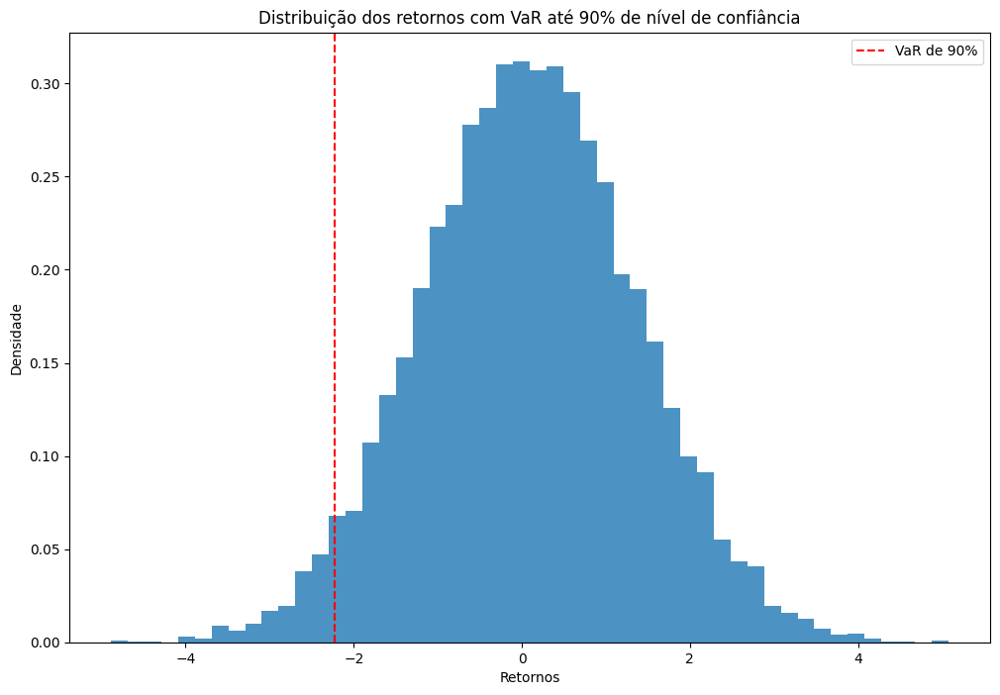

In [85]:
np.random.seed(42)

returns = np.random.normal(best_return*100, best_vol*100, 10000)

# Calculate the VaR at the 90% confidence level
confidence_level = 0.90
var_90 = get_value_at_risk(returns, confidence_level)

# Plot the distribution of returns with the VaR level
fig, ax = plt.subplots(figsize=(12,8))
ax.hist(returns, bins=50, density=True, alpha=0.8)
ax.axvline(x=var_90, color='r', linestyle='--', label=f'VaR de {confidence_level*100:.0f}%')
ax.legend()
ax.set_xlabel('Retornos')
ax.set_ylabel('Densidade')
ax.set_title('Distribuição dos retornos com VaR até 90% de nível de confiância')
plt.show()

In [89]:
confidence_level = 0.90
returns = stocks_values['total_value']
var_90 = get_value_at_risk(returns, confidence_level)
print(f'VaR no intervalo de confiância de 90%: {var_90:.2f}')

VaR no intervalo de confiância de 90%: -72016.16


In [92]:
print(f"Media de ganho: R$ {stocks_values['total_value'].mean():.2f}")
print(f"Desvio padrão de ganho: R$ {stocks_values['total_value'].std():.2f}")

Media de ganho: R$ 72014.02
Desvio padrão de ganho: R$ 24735.20


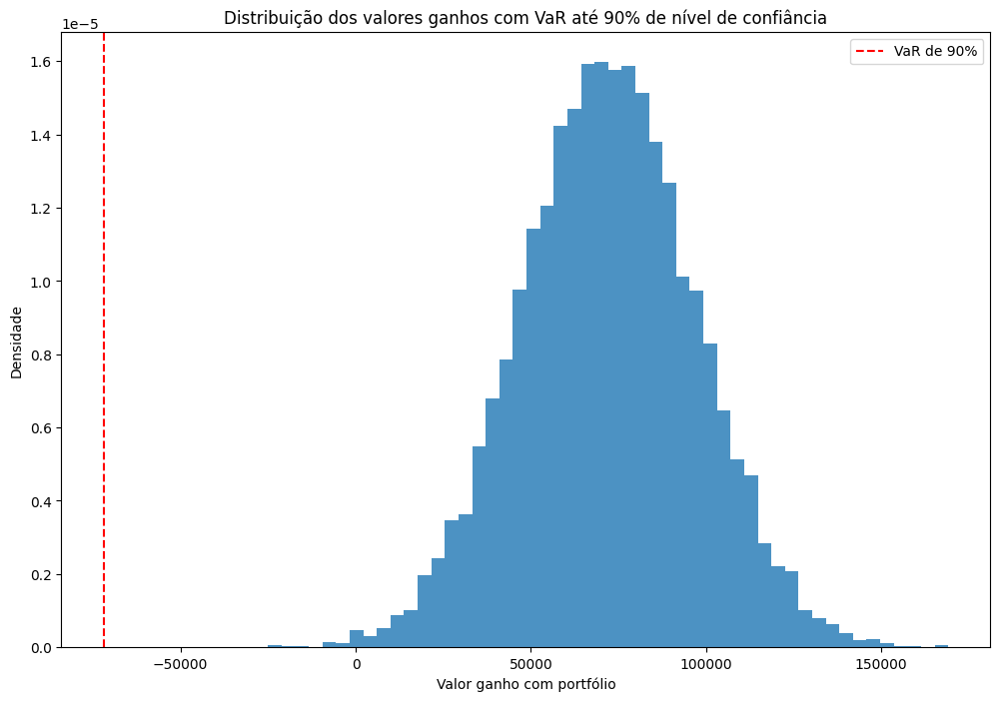

In [93]:
np.random.seed(42)

returns = np.random.normal(stocks_values['total_value'].mean(), stocks_values['total_value'].std(), 10000)

confidence_level = 0.90
var_90 = get_value_at_risk(returns, confidence_level)

fig, ax = plt.subplots(figsize=(12,8))
ax.hist(returns, bins=50, density=True, alpha=0.8)
ax.axvline(x=var_90, color='r', linestyle='--', label=f'VaR de {confidence_level*100:.0f}%')
ax.legend()
ax.set_xlabel('Valor ganho com portfólio')
ax.set_ylabel('Densidade')
ax.set_title('Distribuição dos valores ganhos com VaR até 90% de nível de confiância')
plt.show()

## Carteira aleatória

Agora, será gerada uma simulação com carteiras aleatórias compostas de 10 ações. A ideia é checar se o retorno médio das carteiras geradas suepra a estratégia com o modelo de Markowitz.

In [50]:
price_data = []
returns_data = []

for ticker in tqdm(list(available_tickers.keys())):
    stock_data = available_tickers[ticker][
        (available_tickers[ticker]['Date'] >= '2014-01-01') & 
        (available_tickers[ticker]['Date'] <= '2024-12-31')
    ].reset_index(drop=True)['Open']
    
    stock_returns = np.log(stock_data / stock_data.shift(1))

    price_data.append(stock_data)
    returns_data.append(stock_returns)

random_portfolio = pd.concat(price_data, axis=1)
random_portfolio_returns = pd.concat(returns_data, axis=1)

random_portfolio.columns = list(available_tickers.keys())
random_portfolio_returns.columns = list(available_tickers.keys())

100%|███████████████████████████████| 127/127 [00:02<00:00, 60.44it/s]


In [51]:
random_portfolio_returns[["FRIO3", "CGAS3"]].std()

FRIO3    0.048195
CGAS3    0.025670
dtype: float64

In [52]:
random_portfolio

,FRIO3,LPSB3,CGAS3,ELET3,PTBL3,TECN3,CSNA3,VALE3,PLAS3,USIM3,...,BBAS3,CRIV3,WEGE3,SGPS3,SBSP3,CEBR3,OIBR3,CVCB3,LIGT3,ENEV3
0,92.689201,13.122008,15.086164,4.681541,3.176313,12.760195,8.622012,18.405229,23.0,9.813094,...,6.237237,3.455436,3.801956,35.400002,20.036514,1.034179,2701.577148,11.255743,18.186223,43.206879
1,94.580818,13.140183,15.086167,4.388450,3.131122,12.314980,8.301578,17.841442,22.5,9.158887,...,6.127543,3.455436,3.707029,35.200001,19.784143,1.067144,2634.410889,11.468390,17.783544,43.777267
2,92.689201,13.312840,14.833807,4.713226,3.079474,12.537586,8.533004,17.236645,22.5,9.797136,...,6.127544,3.455436,3.663214,35.000000,19.692377,1.067144,3134.426514,11.695708,18.309492,46.058819
3,96.157166,12.867565,15.091963,4.847890,3.040738,12.219574,8.521135,17.431409,23.0,9.837027,...,6.096931,3.455436,3.658348,36.000000,19.279408,1.067144,3097.112061,11.747036,18.243751,49.195953
4,93.319740,13.040222,15.091963,4.705306,3.047195,12.545536,8.455860,17.164894,22.0,9.908831,...,5.994894,3.455436,3.679035,33.400002,19.332939,1.067144,3000.093994,11.666377,17.537009,49.195953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2702,153.979996,1.670000,128.188766,35.590000,4.150000,5.060000,12.000000,61.990002,6.0,6.410000,...,26.100000,6.980000,55.009998,1.640000,89.000000,18.950001,4.190000,2.020000,4.920000,12.140000
2703,153.000000,1.650000,128.188769,35.700001,4.100000,5.210000,11.580000,59.750000,6.0,6.120000,...,26.100000,6.980000,54.660000,1.640000,89.550003,18.950001,4.200000,2.020000,4.870000,12.220000
2704,155.990005,1.620000,129.456037,35.840000,4.130000,5.430000,11.250000,58.580002,6.0,5.950000,...,26.010000,6.980000,55.099998,1.640000,92.800003,18.559999,2.490000,2.070000,4.930000,12.250000
2705,160.000000,1.610000,128.589996,35.369999,4.120000,5.430000,10.900000,57.320000,6.0,5.970000,...,25.990000,6.980000,55.160000,1.640000,95.900002,18.780001,1.010000,2.300000,4.910000,12.310000


In [53]:
num_simulations = 50000

simulated_returns = np.zeros(num_simulations)
simulated_vol = np.zeros(num_simulations)
simulated_sharpe_ratio = np.zeros(num_simulations)
final_portfolio_values = np.zeros(num_simulations)
initial_investment = 35000

### 10 ações

In [54]:
for i in tqdm(range(num_simulations)):
    random_tickers = random.choices(list(available_tickers.keys()), k=10)
    simulated_returns[i] = random_portfolio_returns[random_tickers].mean().mean()
    weights = np.ones(10) / 10
    simulated_vol[i] = np.sqrt(np.dot(weights.T, np.dot(random_portfolio_returns[random_tickers].cov(), weights)))
    simulated_sharpe_ratio[i] = simulated_returns[i]/simulated_vol[i]
    cumulative_log_return = random_portfolio_returns[random_tickers].mean(axis=1).sum()
    
    growth_factor = np.exp(cumulative_log_return)

    final_portfolio_values[i] = initial_investment * growth_factor

100%|███████████████████████████| 50000/50000 [09:53<00:00, 84.24it/s]


In [55]:
print(f'Média do Sharpe Ratio: {simulated_sharpe_ratio.mean()}')

Média do Sharpe Ratio: -0.002915816655464186


In [56]:
print(f'Média dos retornos: {simulated_returns.mean()}')

Média dos retornos: -6.774172907292032e-05


In [57]:
print(f'Média dos ganhos: R$ {final_portfolio_values.mean()}')

Média dos ganhos: R$ 36852.19181708624


In [58]:
print(f'Risco médio para ganhos maiores que carteira com modelo de Markowitz (R$ {total_sum:.2f}): '
      f'{simulated_vol[np.where(final_portfolio_values > total_sum)].mean()}')

Risco médio para ganhos maiores que carteira com modelo de Markowitz (R$ 86687.52): 0.014890269155231407


In [59]:
print(f'Sharpe Ratio médio para ganhos maiores que carteira com modelo de Markowitz (R$ {total_sum}): '
      f'{simulated_sharpe_ratio[np.where(final_portfolio_values > total_sum)].mean()}')

Sharpe Ratio médio para ganhos maiores que carteira com modelo de Markowitz (R$ 86687.51699174444): 0.026975447050837105


In [60]:
print('Número de carteiras melhores que carteira com modelo de Markowitz:', 
      len(final_portfolio_values[final_portfolio_values > total_sum]))

Número de carteiras melhores que carteira com modelo de Markowitz: 1814


In [61]:
print('Porcentagem de carteiras com ganho: ' 
      f'{100*len(final_portfolio_values[final_portfolio_values > 35000])/len(final_portfolio_values)} %')

Porcentagem de carteiras com ganho: 45.962 %


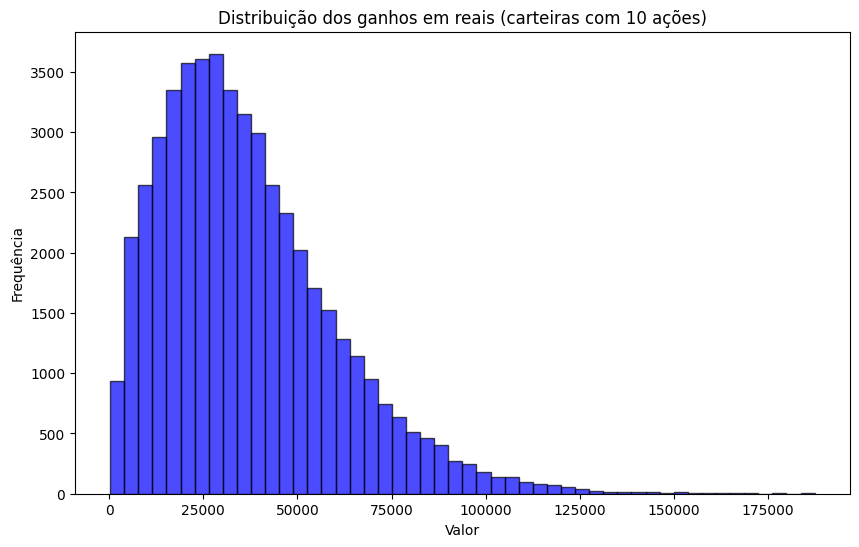

In [62]:
plt.figure(figsize=(10, 6))
plt.hist(final_portfolio_values, bins=50, color='blue', edgecolor='black', alpha=0.7)
plt.title("Distribuição dos ganhos em reais (carteiras com 10 ações)")
plt.xlabel("Valor")
plt.ylabel("Frequência")
plt.ticklabel_format(style='plain', axis='x') 
plt.show()

### 20 ações

In [63]:
for i in tqdm(range(num_simulations)):
    random_tickers = random.choices(list(available_tickers.keys()), k=20)
    simulated_returns[i] = random_portfolio_returns[random_tickers].mean().mean()
    weights = np.ones(20) / 20
    simulated_vol[i] = np.sqrt(np.dot(weights.T, np.dot(random_portfolio_returns[random_tickers].cov(), weights)))
    simulated_sharpe_ratio[i] = simulated_returns[i]/simulated_vol[i]
    cumulative_log_return = random_portfolio_returns[random_tickers].mean(axis=1).sum()
    
    growth_factor = np.exp(cumulative_log_return)

    final_portfolio_values[i] = initial_investment * growth_factor

100%|███████████████████████████| 50000/50000 [13:58<00:00, 59.60it/s]


In [64]:
print(f'Média do Sharpe Ratio: {simulated_sharpe_ratio.mean()}')

Média do Sharpe Ratio: -0.003969698457325113


In [65]:
print(f'Média dos retornos: {simulated_returns.mean()}')

Média dos retornos: -6.789250316767901e-05


In [66]:
print(f'Média dos ganhos: R$ {final_portfolio_values.mean()}')

Média dos ganhos: R$ 33119.45721772785


In [67]:
print(f'Risco médio para ganhos maiores que carteira com modelo de Markowitz (R$ {total_sum:.2f}): '
      f'{simulated_vol[np.where(final_portfolio_values > total_sum)].mean()}')

Risco médio para ganhos maiores que carteira com modelo de Markowitz (R$ 86687.52): 0.01335952284738918


In [68]:
print(f'Sharpe Ratio médio para ganhos maiores que carteira com modelo de Markowitz (R$ {total_sum}): '
      f'{simulated_sharpe_ratio[np.where(final_portfolio_values > total_sum)].mean()}')

Sharpe Ratio médio para ganhos maiores que carteira com modelo de Markowitz (R$ 86687.51699174444): 0.027628862844659735


In [69]:
print('Número de carteiras melhores que carteira com modelo de Markowitz:', 
      len(final_portfolio_values[final_portfolio_values > total_sum]))

Número de carteiras melhores que carteira com modelo de Markowitz: 224


In [70]:
print('Porcentagem de carteiras com ganho: ' 
      f'{100*len(final_portfolio_values[final_portfolio_values > 35000])/len(final_portfolio_values)} %')

Porcentagem de carteiras com ganho: 40.632 %


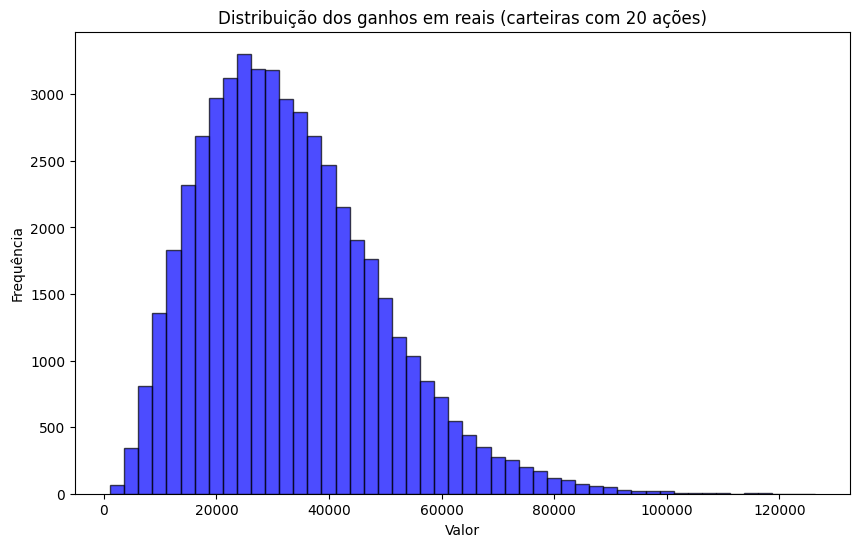

In [71]:
plt.figure(figsize=(10, 6))
plt.hist(final_portfolio_values, bins=50, color='blue', edgecolor='black', alpha=0.7)
plt.title("Distribuição dos ganhos em reais (carteiras com 20 ações)")
plt.xlabel("Valor")
plt.ylabel("Frequência")
plt.ticklabel_format(style='plain', axis='x') 
plt.show()

## Conclusões

* Comparando a melhor carteira com o modelo de Markowitz e as melhores carteiras aleatórias (seja para 10 ou 20 ativos), vemos que o risco média das carteiras aleatórias para situações que elas são mais vantajosa é maior que o risco apresentado pela carteira ótima de Markowitz;
* Os filtros usados para selecionar os 10 ativos no caso do modelo de Markowitz com certeza tem influência nos resultados (ações do Ibovespa e com maior crescimento entre janeiro e fevereiro de 2014), mas também conseguem indicar o seguinte: mesmo sem nenhum tipo de filtro, considerando só ações que tem o código existente até 2024, seria possível "ganhar dinheiro" (ignorando a inflação, obviamente) em cerca de 40% das vezes;
* O que, em uma análise simples, leva às seguintes conclusões:
  * **Diversificação é um fator importantíssimo (já provado inúmeras vezes) para diluição de risco**, independente da forma de escolher e balancear os ativos;
  * Empresas boas (com lucro recorrente), a longo prazo, irão gerar resultados mais consistentes e mais valor, o que irá refletir em seu preço;
  * Por último: estatisticamente falando, a longo prazo inclusive, a chance maior é de não bater o mercado (como o gráfico das carteiras aleatórias mostra). Nesse sentido, para pessoas comuns (e sem informações internas), talvez o melhor seja investir em [índices passivos](https://en.wikipedia.org/wiki/Index_fund), que refletem uma cesta de ações de determinado mercado e tem taxas de administração mais baixas que fundos tradicionais, o que, em tese, acompanharia a média do mercado, que a longo prazo (até hoje, pelo menos) tende a crescer. A ideia já [foi defendida até por Buffet](https://finance.yahoo.com/news/warren-buffett-says-dies-90-133400915.html), que supostamente incluiu em seu testamento um pedido ao administrador da herança: "coloque 10% do dinheiro em títulos públicos de curto prazo e 90% em um fundo de índice S&P 500 de custo muito baixo".